# Clusterizacao - Case ImdbMovies

# IMDb TOP 250 Movies
![An image](https://static.amazon.jobs/teams/53/images/IMDb_Header_Page.jpg?1501027252)

**Este projeto consiste em treinar um sistema de recomendação de filmes utilizando as informações referentes aos top 250 filmes melhor avaliados pelo público na plataforma IMDb.**
*   A extração dos dados será feita por técnicas de web scraping (crawler).
*   O objetivo principal será agrupar os 250 filmes em "n" clusters classificados a partir das suas sinopses, aplicando técnicas de processamento de texto e algoritmos de clusterização.
*   Ao final, teremos um sistemas de recomendação baseado na similaridade das sinopses, e não apenas dos generos.

**Exemplo de aplicação prática: usuários receberão recomendações de filmes que estejam no mesmo cluster de sinopses de outros filmes que ele já tenha curtido.**

# Import das bibliotecas

In [1]:
import pandas as pd
import numpy as np
import requests
from pprint import pprint
from bs4 import BeautifulSoup
import re
import json
from urllib.request import Request, urlopen
from lxml import html
import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Web Scraping / Crawler

In [2]:
userAgents=[
    "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) HeadlessChrome/74.0.3729.157 Safari/537.36",
    "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_5) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/12.1.1 Safari/605.1.15"]

url = 'https://www.imdb.com/chart/top/?ref_=nv_mv_250'
response = requests.get(url, headers={"User-agent": userAgents[1]})
response

<Response [200]>

In [3]:
html = response.text
html

'<!DOCTYPE html><html lang="en-US" xmlns:og="http://opengraphprotocol.org/schema/" xmlns:fb="http://www.facebook.com/2008/fbml"><head><meta charSet="utf-8"/><meta name="viewport" content="width=device-width"/><script>if(typeof uet === \'function\'){ uet(\'bb\', \'LoadTitle\', {wb: 1}); }</script><script>window.addEventListener(\'load\', (event) => {\n        if (typeof window.csa !== \'undefined\' && typeof window.csa === \'function\') {\n            var csaLatencyPlugin = window.csa(\'Content\', {\n                element: {\n                    slotId: \'LoadTitle\',\n                    type: \'service-call\'\n                }\n            });\n            csaLatencyPlugin(\'mark\', \'clickToBodyBegin\', 1693002291150);\n        }\n    })</script><title>IMDb Top 250 Movies</title><meta name="description" content="IMDb Top 250 as rated by regular IMDb voters" data-id="main"/><meta property="og:site_name" content="IMDb"/><meta property="og:title" content="IMDb Top 250 Movies"/><meta 

In [4]:
#BeautifulSoup
bs = BeautifulSoup(html)
pprint(bs)


<!DOCTYPE html>
<html lang="en-US" xmlns:fb="http://www.facebook.com/2008/fbml" xmlns:og="http://opengraphprotocol.org/schema/"><head><meta charset="utf-8"/><meta content="width=device-width" name="viewport"/><script>if(typeof uet === 'function'){ uet('bb', 'LoadTitle', {wb: 1}); }</script><script>window.addEventListener('load', (event) => {
        if (typeof window.csa !== 'undefined' && typeof window.csa === 'function') {
            var csaLatencyPlugin = window.csa('Content', {
                element: {
                    slotId: 'LoadTitle',
                    type: 'service-call'
                }
            });
            csaLatencyPlugin('mark', 'clickToBodyBegin', 1693002291150);
        }
    })</script><title>IMDb Top 250 Movies</title><meta content="IMDb Top 250 as rated by regular IMDb voters" data-id="main" name="description"/><meta content="IMDb" property="og:site_name"/><meta content="IMDb Top 250 Movies" property="og:title"/><meta content="IMDb Top 250 as rated b

## Title EN

In [5]:
titles = bs.find_all('h3', attrs={'class': 'ipc-title__text'})
titles

[<h3 class="ipc-title__text">IMDb Charts</h3>,
 <h3 class="ipc-title__text">1. The Shawshank Redemption</h3>,
 <h3 class="ipc-title__text">2. The Godfather</h3>,
 <h3 class="ipc-title__text">3. The Dark Knight</h3>,
 <h3 class="ipc-title__text">4. The Godfather Part II</h3>,
 <h3 class="ipc-title__text">5. 12 Angry Men</h3>,
 <h3 class="ipc-title__text">6. Schindler's List</h3>,
 <h3 class="ipc-title__text">7. The Lord of the Rings: The Return of the King</h3>,
 <h3 class="ipc-title__text">8. Pulp Fiction</h3>,
 <h3 class="ipc-title__text">9. The Lord of the Rings: The Fellowship of the Ring</h3>,
 <h3 class="ipc-title__text">10. The Good, the Bad and the Ugly</h3>,
 <h3 class="ipc-title__text">11. Forrest Gump</h3>,
 <h3 class="ipc-title__text">12. Fight Club</h3>,
 <h3 class="ipc-title__text">13. The Lord of the Rings: The Two Towers</h3>,
 <h3 class="ipc-title__text">14. Inception</h3>,
 <h3 class="ipc-title__text">15. Star Wars: Episode V - The Empire Strikes Back</h3>,
 <h3 class=

In [6]:
list_title_en = []
for x in titles[1:-12]:
  tit = (x.text).split(">")[0].strip()
  list_title_en.append(tit)

display(len(list_title_en))
list_title_en[:5]

250

['1. The Shawshank Redemption',
 '2. The Godfather',
 '3. The Dark Knight',
 '4. The Godfather Part II',
 '5. 12 Angry Men']

## Year

In [9]:
list_years = []
years = bs.find_all('div', attrs={'class':'sc-b85248f1-5 kZGNjY cli-title-metadata'})
for y in years:
  year = y.find('span', attrs={'class':'sc-b85248f1-6 bnDqKN cli-title-metadata-item'}).text
  list_years.append(year)
display(len(list_years))
list_years[:5]

250

['1994', '1972', '2008', '1974', '1957']

## Rating

In [13]:
ratings = bs.find_all('div', attrs={'class':'sc-e3e7b191-0 iKUUVe sc-b85248f1-2 wTpct cli-ratings-container'})
list_rating = []
for r in ratings:
  rating = r.find('span').text
  list_rating.append(rating[:3])

display(len(list_rating))
pprint(list_rating[:5])

250

['9.3', '9.2', '9.0', '9.0', '9.0']


## Genre, Title PT & Year

In [14]:
list_links = []
for a in bs.find_all('a', href=True):
  if '/title/' in a['href'] and 'https://www.imdb.com/'+ a['href'] not in list_links:
    list_links.append(('https://www.imdb.com/'+a['href'])[:-15])

#Remove duplicates
list_links = list(dict.fromkeys(list_links))
#Deleting first element
list_links = list_links[1:]

display(len(list_links))
list_links[:5]

250

['https://www.imdb.com//title/tt0111161/',
 'https://www.imdb.com//title/tt0068646/',
 'https://www.imdb.com//title/tt0468569/',
 'https://www.imdb.com//title/tt0071562/',
 'https://www.imdb.com//title/tt0050083/']

In [15]:
headers = {
          'authority': 'www.amazon.com.br',
          'accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7',
          'accept-language': 'pt-BR,pt;q=0.9,en-US;q=0.8,en;q=0.7',
          'cache-control': 'max-age=0',
          'device-memory': '8',
          'downlink': '10',
          'dpr': '1.875',
          'ect': '4g',
          'rtt': '50',
          'sec-ch-device-memory': '8',
          'sec-ch-dpr': '1.875',
          'sec-ch-ua': '"Chromium";v="110", "Not A(Brand";v="24", "Google Chrome";v="110"',
          'sec-ch-ua-mobile': '?0',
          'sec-ch-ua-platform': '"Windows"',
          'sec-ch-ua-platform-version': '"10.0.0"',
          'sec-ch-viewport-width': '455',
          'sec-fetch-dest': 'document',
          'sec-fetch-mode': 'navigate',
          'sec-fetch-site': 'none',
          'sec-fetch-user': '?1',
          'upgrade-insecure-requests': '1',
          'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/110.0.0.0 Safari/537.36',
          'viewport-width': '455',
          }
############################################################
list_genre = []
list_title_pt = []
list_year = []
list_sinopse = []

for link in list_links:
  time.sleep(.5)
  response = requests.get(link, headers = headers)
  html = response.content
  soup = BeautifulSoup(html, "html.parser")

  #genre
  try:
    for genre in soup.find('span', {'class':'ipc-chip__text'}):
      genre = genre.text
      list_genre.append(genre)
  except:
      list_genre.append(np.nan)
      print('Nan')

  #title_PT and year
  try:
    for x in soup.find('title'):
      #title_pt
      title_pt = (x.text)[:-14].strip()
      list_title_pt.append(title_pt)
      #year
      year = (x.text)[-12:-8].strip()
      list_year.append(year)

  except:
    list_title_pt.append(np.nan)
    list_year.append(np.nan)

  #sinopse
  try:
    for sin in soup.find('span', {"data-testid":"plot-xl"}):
      sinopse = sin.text
      list_sinopse.append(sinopse)
  except:
    list_sinopse.append(np.nan)

  print(genre, title_pt, year, sinopse[:20])

display(len(list_genre), len(list_title_pt), len(list_year), len(list_sinopse))
print(list_genre[:5])
print(list_title_pt[:5])
print(list_year[:5])
display(list_sinopse[:2])

Drama Um Sonho de Liberdade 1994 Dois homens presos s
Policial O Poderoso Chefão 1972 O patriarca idoso de
Ação Batman: O Cavaleiro das Trevas 2008 Quando a ameaça conh
Policial O Poderoso Chefão II 1974 Em 1950, Michael Cor
Policial 12 Homens e uma Sentença 1957 O julgamento de um a
Biografia A Lista de Schindler 1993 Na Polônia ocupada p
Ação O Senhor dos Anéis: O Retorno do Rei 2003 Gandalf e Aragorn li
Policial Pulp Fiction - Tempo de Violência 1994 As vidas de dois ass
Ação O Senhor dos Anéis: A Sociedade do Anel 2001 Um manso hobbit do C
Aventura Três Homens em Conflito 1966 Um impostor se junta
Drama Forrest Gump: O Contador de Histórias 1994 Os governos dos pres
Drama Clube da Luta 1999 Um trabalhador de es
Ação O Senhor dos Anéis: As Duas Torres 2002 Enquanto Frodo e Sam
Ação A Origem 2010 Um ladrão que rouba 
Ação Star Wars: Episódio V - O Império Contra-Ataca 1980 Os rebeldes derrotar
Ação Matrix 1999 Um hacker aprende co
Biografia Os Bons Companheiros 1990 A historia do Hen

250

250

250

250

['Drama', 'Policial', 'Ação', 'Policial', 'Policial']
['Um Sonho de Liberdade', 'O Poderoso Chefão', 'Batman: O Cavaleiro das Trevas', 'O Poderoso Chefão II', '12 Homens e uma Sentença']
['1994', '1972', '2008', '1974', '1957']


['Dois homens presos se reúnem ao longo de vários anos, encontrando consolo e eventual redenção através de atos de decência comum.',
 'O patriarca idoso de uma dinastia do crime organizado transfere o controle de seu império clandestino para seu filho relutante.']

## DataFrame

In [21]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [17]:
#completar
df = pd.DataFrame({'title_pt':list_title_pt,
                   'title_en':list_title_en,
                   'year':list_year,
                   'rating':list_rating,
                   'genre':list_genre,
                   'sinopse':list_sinopse})
display(df.head())

,title_pt,title_en,year,rating,genre,sinopse
0,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,Dois homens presos se reúnem ao longo de vário...
1,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,O patriarca idoso de uma dinastia do crime org...
2,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,Quando a ameaça conhecida como O Coringa surge...
3,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"Em 1950, Michael Corleone, agora à frente da f..."
4,12 Homens e uma Sentença,5. 12 Angry Men,1957,9.0,Policial,O julgamento de um assassinato em Nova Iorque ...


# Export df to csv

In [18]:
from datetime import datetime
today = datetime.today().strftime('%Y%m%d')
today

'20230825'

In [27]:
path_to_export = '/content/drive/MyDrive/MLFIAP'
df.to_csv(f'{path_to_export}/top250_movies_{today}.csv', sep = ';',index = False)

# Merge with historical data

In [28]:
#Merge with historical data
from glob import glob

#loading MES
list_files = []
for file in glob(path_to_export + '/*.csv'):
    list_files.append(file)

#appending each tag file in a list
list_df = []
c = 0
for file in list_files:
    print(f'{c+1} of {len(list_files)} | {file}')
    df_temp = pd.read_csv(  file, sep = ';')
    list_df.append(df_temp)
    c += 1

#mergin all files
df_historical = pd.concat(list_df, axis = 0, copy = False)
df_historical = df_historical.drop_duplicates(subset=['title_pt'], keep = 'last')
df_historical = df_historical.reset_index(drop = True)
display(df_historical.shape)
display(df_historical)

1 of 1 | /content/drive/MyDrive/MLFIAP/top250_movies_20230825.csv


(249, 6)

,title_pt,title_en,year,rating,genre,sinopse
0,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,Dois homens presos se reúnem ao longo de vário...
1,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,O patriarca idoso de uma dinastia do crime org...
2,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,Quando a ameaça conhecida como O Coringa surge...
3,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"Em 1950, Michael Corleone, agora à frente da f..."
4,12 Homens e uma Sentença,5. 12 Angry Men,1957,9.0,Policial,O julgamento de um assassinato em Nova Iorque ...
...,...,...,...,...,...,...
244,Histórias Cruzadas,246. The Help,2011,8.1,Drama,Uma aspirante a escritora durante o movimento ...
245,Quando Duas Mulheres Pecam,247. Persona,1966,8.1,Drama,Uma enfermeira é encarregada de uma atriz sile...
246,A Vida de Brian,248. Life of Brian,1979,8.0,Comédia,Nascido no Natal original no estábulo ao lado ...
247,Aladdin,249. Aladdin,1992,8.0,Animação,Um menino de rua bondoso e um Vizir competem p...


# Export historical data

In [29]:
df_historical.to_csv(f'{path_to_export}/all_movies.csv', sep = ';',index = False)

#EDA - Exploratory Data Analysis

In [30]:
df = pd.read_csv(f'{path_to_export}/all_movies.csv', sep = ';')

print(df.shape)
df.head()

(249, 6)


,title_pt,title_en,year,rating,genre,sinopse
0,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,Dois homens presos se reúnem ao longo de vário...
1,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,O patriarca idoso de uma dinastia do crime org...
2,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,Quando a ameaça conhecida como O Coringa surge...
3,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"Em 1950, Michael Corleone, agora à frente da f..."
4,12 Homens e uma Sentença,5. 12 Angry Men,1957,9.0,Policial,O julgamento de um assassinato em Nova Iorque ...


In [31]:
# Adjusting variable types
df['year'] = df['year'].astype('int64')
df['rating'] = df['rating'].astype('float64')

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249 entries, 0 to 248
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   title_pt  249 non-null    object 
 1   title_en  249 non-null    object 
 2   year      249 non-null    int64  
 3   rating    249 non-null    float64
 4   genre     249 non-null    object 
 5   sinopse   249 non-null    object 
dtypes: float64(1), int64(1), object(4)
memory usage: 11.8+ KB


In [33]:
df.describe()

,year,rating
count,249.000000,249.000000
mean,1986.779116,8.307229
std,25.439115,0.233029
min,1921.000000,8.000000
25%,1966.000000,8.100000
50%,1994.000000,8.200000
75%,2007.000000,8.400000
max,2023.000000,9.300000


## Plots

In [34]:
df.genre.value_counts('d')

Drama         0.277108
Ação          0.180723
Policial      0.140562
Animação      0.096386
Biografia     0.092369
Comédia       0.092369
Aventura      0.080321
Terror        0.016064
Mistério      0.016064
Faroeste      0.004016
Filme noir    0.004016
Name: genre, dtype: float64

In [35]:
fig = px.bar(df.genre.value_counts('d')*100,
             text_auto=True,
             title = '% de Filmes por Gênero',
             labels={'index':'Gênero',
                     'value':'% de Filmes'})
fig.show()

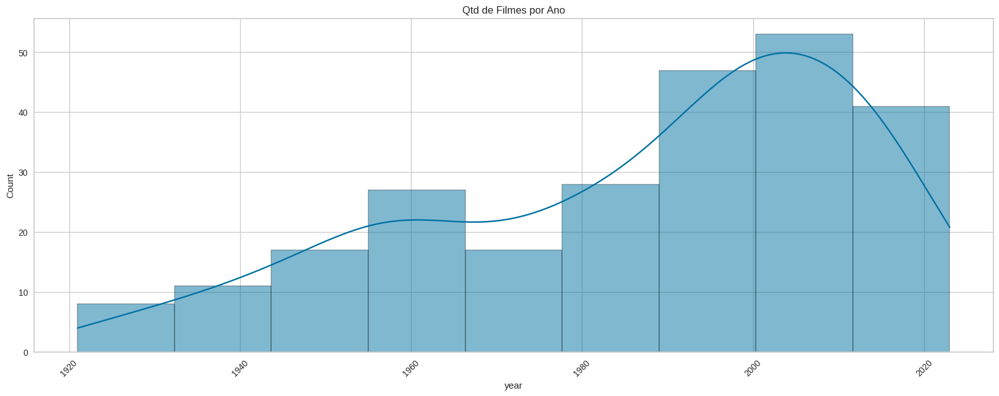

In [36]:
plt.figure(figsize = (20,7))
sns.histplot( df,
              x = 'year',
              kde = True).set_title('Qtd de Filmes por Ano')
plt.xticks(rotation=45)
plt.show()

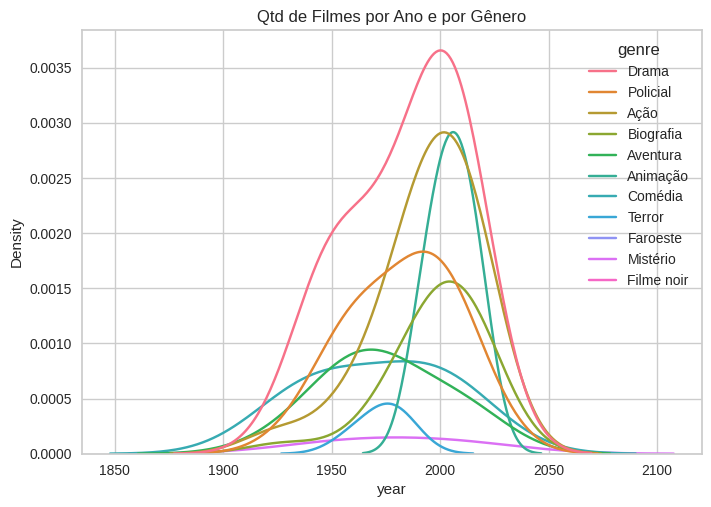

In [37]:
sns.kdeplot( df, x = 'year', hue = 'genre', bw_adjust = 1.5, warn_singular = False).set_title('Qtd de Filmes por Ano e por Gênero')
plt.show()

# Pré-processamento de texto

In [38]:
#convert sinopses to lowercase
df_processed = df.copy()
df_processed['sinopse'] = df_processed['sinopse'].str.lower()
df_processed['sinopse'].head()

0    dois homens presos se reúnem ao longo de vário...
1    o patriarca idoso de uma dinastia do crime org...
2    quando a ameaça conhecida como o coringa surge...
3    em 1950, michael corleone, agora à frente da f...
4    o julgamento de um assassinato em nova iorque ...
Name: sinopse, dtype: object

In [39]:
def qty_words(text):
    words= text.split()
    word_count = len(words)
    return word_count

In [40]:
### Feature Engineering
df_processed['word_count'] = df_processed['sinopse'].apply(qty_words).astype('int64')
df_processed.head()

,title_pt,title_en,year,rating,genre,sinopse,word_count
0,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21
1,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20
2,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33
3,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41
4,12 Homens e uma Sentença,5. 12 Angry Men,1957,9.0,Policial,o julgamento de um assassinato em nova iorque ...,29


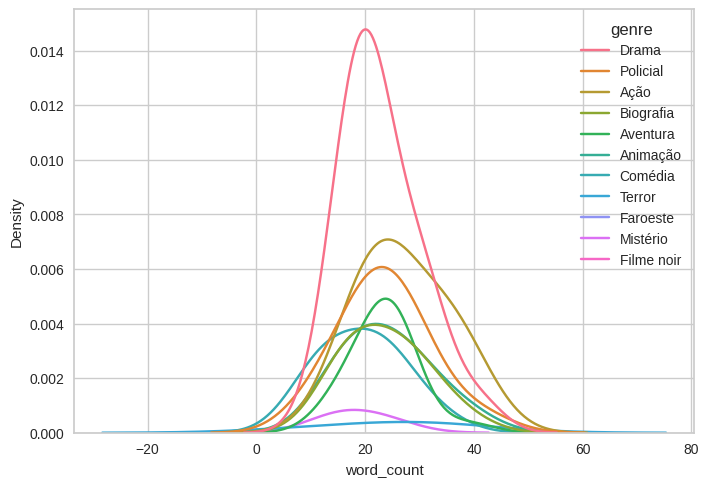

In [41]:
sns.kdeplot( df_processed, x = 'word_count', hue = 'genre', bw_adjust = 1.5, warn_singular = False)
plt.show()

## Nuvem de palavras

### Antes de remover as stopwords

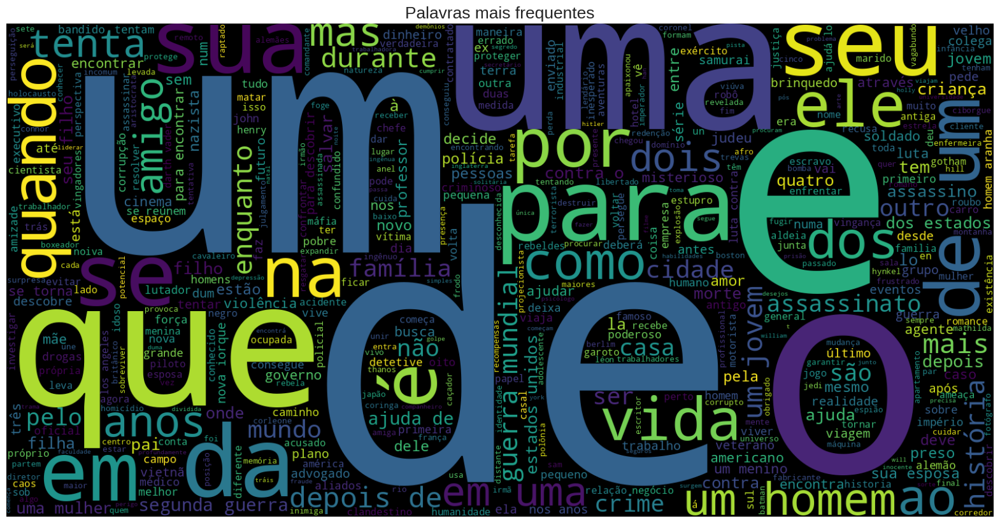

In [42]:
text = ' '.join([phrase for phrase in df_processed['sinopse']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes', fontsize = 19)
plt.show()

### Após remoção das stopwords

In [43]:
import nltk
nltk.download('stopwords')

stopwords = nltk.corpus.stopwords.words('portuguese')
print(stopwords)

['a', 'à', 'ao', 'aos', 'aquela', 'aquelas', 'aquele', 'aqueles', 'aquilo', 'as', 'às', 'até', 'com', 'como', 'da', 'das', 'de', 'dela', 'delas', 'dele', 'deles', 'depois', 'do', 'dos', 'e', 'é', 'ela', 'elas', 'ele', 'eles', 'em', 'entre', 'era', 'eram', 'éramos', 'essa', 'essas', 'esse', 'esses', 'esta', 'está', 'estamos', 'estão', 'estar', 'estas', 'estava', 'estavam', 'estávamos', 'este', 'esteja', 'estejam', 'estejamos', 'estes', 'esteve', 'estive', 'estivemos', 'estiver', 'estivera', 'estiveram', 'estivéramos', 'estiverem', 'estivermos', 'estivesse', 'estivessem', 'estivéssemos', 'estou', 'eu', 'foi', 'fomos', 'for', 'fora', 'foram', 'fôramos', 'forem', 'formos', 'fosse', 'fossem', 'fôssemos', 'fui', 'há', 'haja', 'hajam', 'hajamos', 'hão', 'havemos', 'haver', 'hei', 'houve', 'houvemos', 'houver', 'houvera', 'houverá', 'houveram', 'houvéramos', 'houverão', 'houverei', 'houverem', 'houveremos', 'houveria', 'houveriam', 'houveríamos', 'houvermos', 'houvesse', 'houvessem', 'houvésse

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


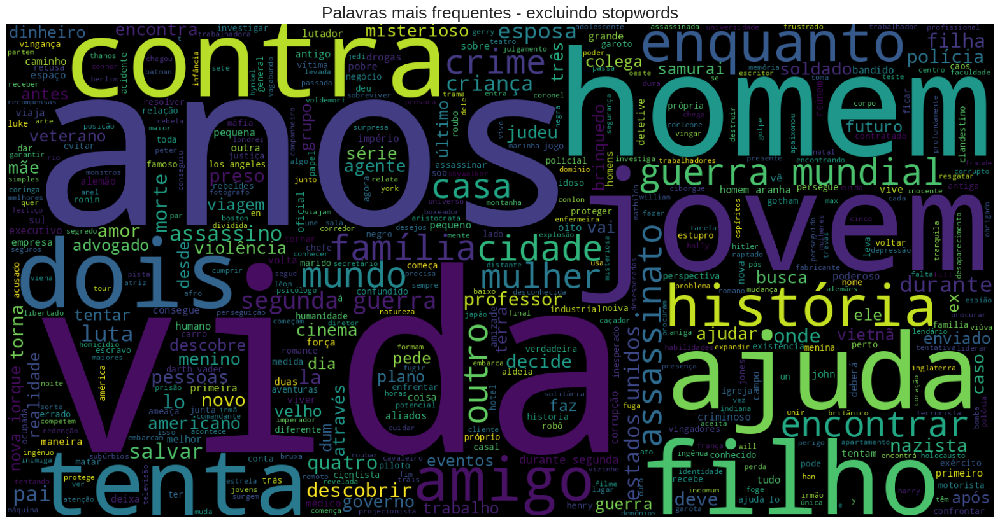

In [44]:
df_processed['sinopse_no_stopwords'] = df_processed['sinopse'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
text = ' '.join([phrase for phrase in df_processed['sinopse_no_stopwords']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes - excluindo stopwords', fontsize = 19)
plt.show()

## Aplicando TF-IDF
Term Frequency-Inverse Document Frequency

O TF-IDF define a importância de um termo levando em consideração a importância desse termo em um único documento e dimensionando-o por sua importância em todos os documentos.

In [45]:
# initialize the vectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=0.95)
# fit_transform applies TF-IDF to clean texts - we save the array of vectors in X
X = vectorizer.fit_transform(df_processed['sinopse_no_stopwords'])

In [46]:
print(X.shape)
X.toarray()

(249, 80)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

# KMeans - Clusterização

## Escolhendo o numero de "k" clusters ideal

### Método Elbow

2 222.2059799835577
3 215.9103571848691
4 209.78310476248745
5 205.95664068173681
6 203.89521125500846
7 198.98539059991592
8 193.7369614244344
9 191.63071342610664
10 186.94885007127658
11 182.2384132081047


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Text(0, 0.5, 'WCSS')

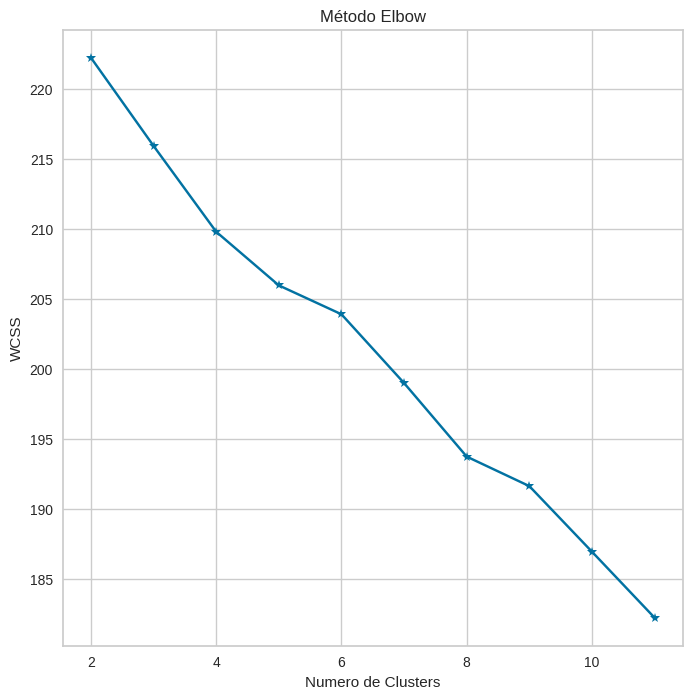

In [47]:
plt.figure(figsize = (8,8))

#plotando o grafico do método elbow
wcss = []

for i in range(2, df_processed.genre.nunique()+1):
  kmeans = KMeans(n_clusters = i, init = 'random')
  kmeans.fit(X)
  print(i, kmeans.inertia_)
  wcss.append(kmeans.inertia_)

plt.plot(range(2, df_processed.genre.nunique()+1), wcss, '*-')
plt.title('Método Elbow')
plt.xlabel('Numero de Clusters')
plt.ylabel('WCSS') #within cluster sum of square


### Método Silhouette

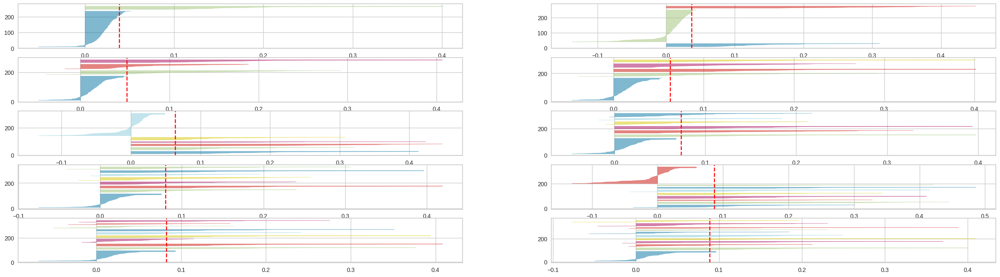

In [48]:
fig, ax = plt.subplots(5,2, figsize = (30,8))
for i in (range(2, df_processed.genre.nunique()+1)):
  #Creating KMeans instance for different number of clusters
  kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 10, max_iter = 100, random_state = 42)
  q, mod = divmod(i,2)

  #Creating SilhouetteVisualizer instance with KMeans instance
  #Fit the visualizer

  visualizer = SilhouetteVisualizer(kmeans, colors = 'yellowbrick', ax = ax[q-1][mod])
  visualizer.fit(X)

### Análise do número de clusters | k = 5
* Tanto ambos métodos não mostraram claramente o numero ideal de clusters, provavelmente em função do numero reduzido de amostras existentes no dataset (250). Para fins didáticos será assumido o numero de k = 5.

# Comparativo entre os 5 clusters

In [49]:
# initialize kmeans with 5 centroids
kmeans = KMeans(n_clusters=5, random_state=42)
# fit the model
kmeans = kmeans.fit(X)
#predicting the clusters and store cluster labels in a variable
labels = kmeans.predict(X)
#getting the cluster centers
c = kmeans.cluster_centers_

df_processed['cluster'] = labels
df_processed.head()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,cluster
0,Um Sonho de Liberdade,1. The Shawshank Redemption,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21,"dois homens presos reúnem longo vários anos, e...",0
1,O Poderoso Chefão,2. The Godfather,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20,patriarca idoso dinastia crime organizado tran...,0
2,Batman: O Cavaleiro das Trevas,3. The Dark Knight,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33,"ameaça conhecida coringa surge passado, causa ...",0
3,O Poderoso Chefão II,4. The Godfather Part II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41,"1950, michael corleone, agora frente família, ...",0
4,12 Homens e uma Sentença,5. 12 Angry Men,1957,9.0,Policial,o julgamento de um assassinato em nova iorque ...,29,julgamento assassinato nova iorque frustrado ú...,0


## Filmes por cluster

In [50]:
fig = px.bar(df_processed.cluster.value_counts(),
             text_auto = True,
             title = 'Qtd de Filmes por Cluster',
             labels = {'index': 'Cluster #',
                       'value':'Qtd. de Filmes'})
fig.show()

## % de Gêneros por Cluster

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3201: UserWarning:

Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.



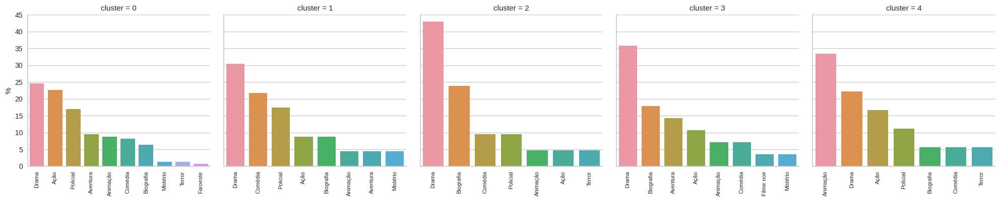

In [51]:
df_plot = df_processed.groupby(['cluster', 'genre'])['title_pt'].count()
df_plot = df_plot.reset_index()
df_plot.rename(columns = {'title_pt':'count'}, inplace = True)
df_plot['%'] = 100 * df_plot['count'] / df_plot.groupby('cluster')['count'].transform('sum')
df_plot = df_plot.sort_values(['cluster', '%'], ascending = False).groupby('cluster').head(11)

fig = sns.catplot(
    data=df_plot, x="genre", y = "%", col="cluster",
    kind="bar", height=4, aspect=1, sharex = False);
fig.set_xlabels('');
fig.set_xticklabels(rotation=90, size = 8);

## Ano de Lançamento por Cluster

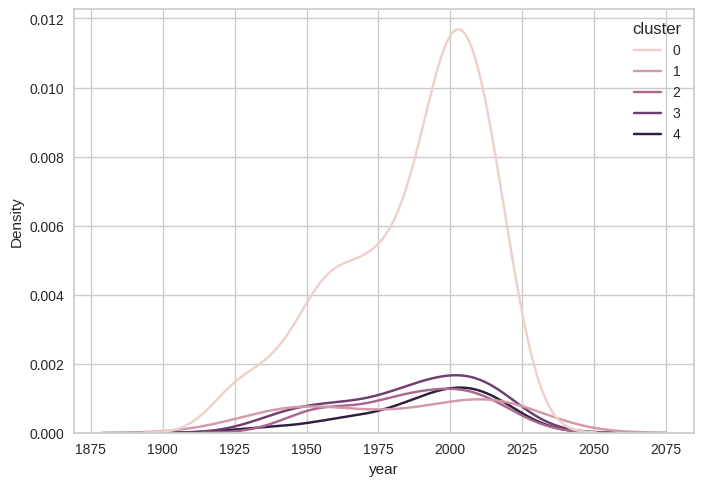

In [52]:
sns.kdeplot(df_processed, x = 'year', hue = 'cluster');

## Radar | Gêneros por Cluster

In [53]:
df_pivot = df_plot.copy()
df_pivot = df_pivot.pivot(index = 'cluster', columns = 'genre', values = '%')
df_pivot.fillna(0, inplace = True)
df_pivot = df_pivot.T.reset_index()
df_pivot.index.name = None
df_pivot

cluster,genre,0,1,2,3,4
0,Animação,8.805031,4.347826,4.761905,7.142857,33.333333
1,Aventura,9.433962,4.347826,0.000000,14.285714,0.000000
2,Ação,22.641509,8.695652,4.761905,10.714286,16.666667
3,Biografia,6.289308,8.695652,23.809524,17.857143,5.555556
4,Comédia,8.176101,21.739130,9.523810,7.142857,5.555556
5,Drama,24.528302,30.434783,42.857143,35.714286,22.222222
6,Faroeste,0.628931,0.000000,0.000000,0.000000,0.000000
7,Filme noir,0.000000,0.000000,0.000000,3.571429,0.000000
8,Mistério,1.257862,4.347826,0.000000,3.571429,0.000000
9,Policial,16.981132,17.391304,9.523810,0.000000,11.111111


In [54]:
df_polar = df_pivot.melt(id_vars=['genre'])
df_polar.head()

,genre,cluster,value
0,Animação,0,8.805031
1,Aventura,0,9.433962
2,Ação,0,22.641509
3,Biografia,0,6.289308
4,Comédia,0,8.176101


In [55]:
fig = px.line_polar(df_polar, r='value', theta='genre', color = 'cluster', line_close=True)
fig.show();

# Nuvem de Palavras por Cluster

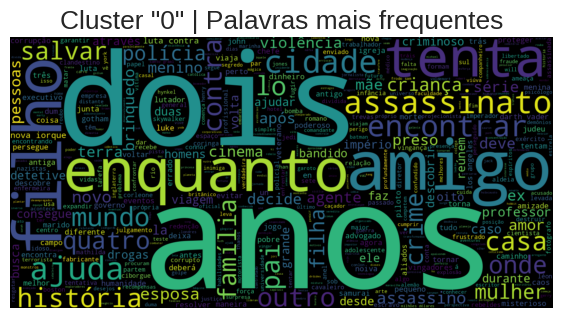

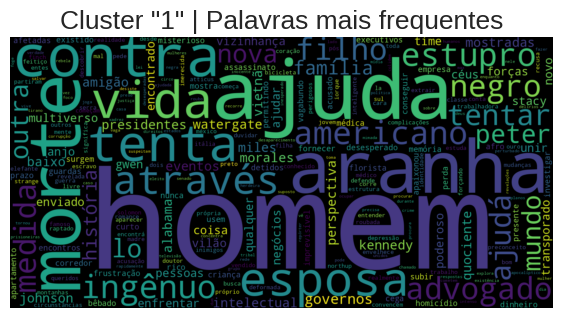

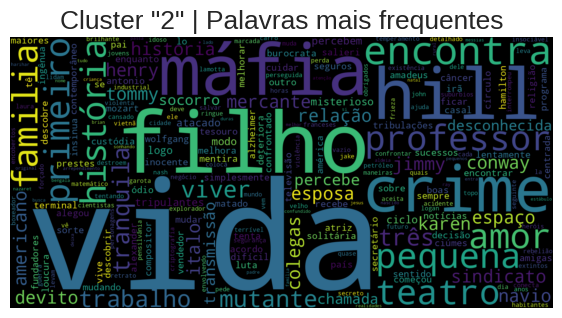

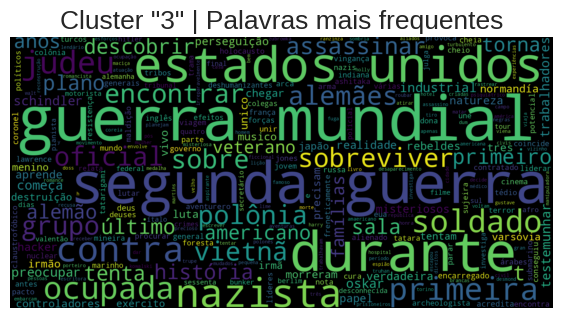

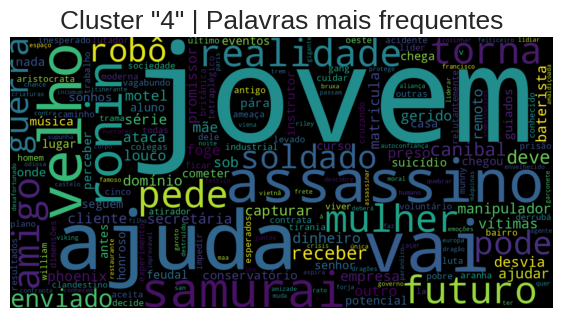

In [56]:
def word_cloud_cluster(cluster:int):
  text = ' '.join([phrase for phrase in df_processed.loc[df_processed.cluster == cluster]['sinopse_no_stopwords']])
  plt.figure(figsize=(7,5), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Cluster "{cluster}" | Palavras mais frequentes', fontsize = 19)
  plt.show()
  return

for c in range(5):
  word_cloud_cluster(c)

# Considerações Finais
* **Exercício: Reescrever as análises / conclusões devido a atualização da base**

** Na seção "Comparativo entre os 5 clusters" foram apresentadas diferentes formas de caracterizar cada cluster.**

1. Primeiro foi demonstrado que o cluster #2 foi o que apresentou o maior número de amostras (filmes). _(Idealmente os cluster devem conter quantidades balanceadas, porém neste projeto, por ter um dataset com baixo número de amostras (250), não foi possível atender esta premissa)_.

2. Depois foi analisado o % de cada gênero por cluster, sendo os dois gêneros mais representativos do:

  2.1 Cluster 0: Animação e Drama

  2.2 Cluster 1: Biografia e Aventura

  2.3 Cluster 2: Drama e Ação

  2.4 Cluster 3: Drama e Biografia

  2.5 Cluster 4: Drama e Comédia


3. Na sequência foi avaliado a distribuição dos anos de lançamento dos filmes por cluster, sem diferença siginificativa entre eles, com maior concentração ao redor do ano 2000.

4. Depois foi apresentado um gráfico de radar por cluster, onde a exemplo do item 2, é possível avaliar a representatividade de cada gênero por cluster.

5. E finalmente, foram apresentadas as nuvens de palavras por cluster, onde em linhas gerais destacam-se:

  5.1 o Cluster 0 com temas sobre Guerra Mundial, Luta, Judeus, Alemães

  5.2 O Cluster 1 e 3 com temas de disputa como Contra, Morte, Advogado, Homem,Polícia

  5.3 o Cluster 2 com temas do cotidiano como Filhos, Amigos, Ajuda, Jovem, Família

  5.4 o Cluster 4 com temas de auto-conhecimento como Busca, Encontrar, Descobrir, Casa, Terra


** Em resumo neste projeto foram aplicados conceitos de:

1. Webscraping / Crawler para coleta de dados do site IMDb
2. Pré-processamento de texto com utilização de técnicas de NLP
3. Clusterização

Desta forma consideramos que o objetivo inicial foi atingido sendo possível a clusterização dos filmes baseado na sinopse / descrição de cada um, gerando desta forma a possibilidade de recomendar filmes aos usuários não apenas pela classificação tradicional por gêneros, mas também pelos clusters identificados neste projeto.

**Em termos práticos, se um usuário avalia positivamente um filme, os filmes pertecentes ao mesmo cluster podem ser recomendados a ele.**